In [ ]:
import pandas as pd
import networkx as nx
import io
import requests
import numpy as np
import matplotlib.pyplot as plt
!pip install powerlaw
!apt install libgraphviz-dev
!pip install pygraphviz
from networkx.drawing.nx_agraph import graphviz_layout
import powerlaw



Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Reading package lists... Done
Building dependency tree       
Reading state information... Done
libgraphviz-dev is already the newest version (2.42.2-3build2).
0 upgraded, 0 newly installed, 0 to remove and 24 not upgraded.
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
# URL to the raw-data
link = "https://raw.githubusercontent.com/Archeron13/Amazon_Analysis_NetworkX/main/Amazon0302.txt"
# Read the CSV file from the URL
response = requests.get(link)
df = pd.read_csv(io.StringIO(response.content.decode('utf-8')), sep='\t', header=None, names=['from_node', 'to_node'])

# Create a new directed graph from the pandas dataframe
net = nx.from_pandas_edgelist(df, source='from_node', target='to_node', create_using=nx.DiGraph())


# The number of nodes and edges in the graph
print("Number of nodes: ", net.number_of_nodes())
print("Number of edges: ", net.number_of_edges())

Number of nodes:  262111
Number of edges:  1234877


In [ ]:
#As the graph is too big to visualize or do any meaningful research on
# We reduce it to around 1000 nodes by taking only nodes where
# shortest_path length is <=7.6

k = 7.5
nodes = [v for v, d in nx.shortest_path_length(net, source=0).items() if d <= k]
G = net.subgraph(nodes)
print(f"Nodes = {G.number_of_nodes()}, Edges = {G.number_of_edges()}")



Nodes = 1040, Edges = 4197


In [ ]:
# Calculating Diameter


#Calculate the diameter by taking the max of all the diameters of every
# Strongly connected component


# get the strongly connected components
sccs = list(nx.strongly_connected_components(G))

scc_diameter = []

# compute the radius and diameter of each strongly connected component
for scc in sccs:
    if (len(scc) == 1):
      continue
    scc_subgraph = G.subgraph(scc)
    scc_diameter.append(nx.diameter(scc_subgraph))
    ##print(f"Strongly connected component {scc}: radius={scc_radius}, diameter={scc_diameter}")
graph_diameter = max(scc_diameter)
print(f"Diameter={graph_diameter}")

Diameter=21


Clustering coefficient global average: 0.4099439124961548
1.0


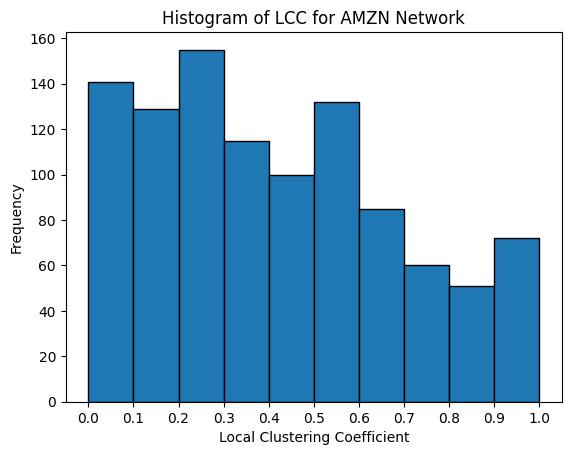

In [ ]:
#Histogram of Local Clustering Coefficient of our network.

cc_global_avg = nx.average_clustering(G)
print("Clustering coefficient global average:", cc_global_avg)


local_cc = nx.clustering(G)
print(max(local_cc.values()))
plt.hist(list(local_cc.values()), bins=[0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6,
                                          0.7, 0.8, 0.9, 1.0], edgecolor='black')
plt.xticks(np.arange(0, 1.1, 0.1))
plt.xlabel("Local Clustering Coefficient")
plt.ylabel("Frequency")
plt.title("Histogram of LCC for AMZN Network")
plt.show()

Number of Nodes:  1040
Number of Edges:  1040
Probability:  0.003884097134818983


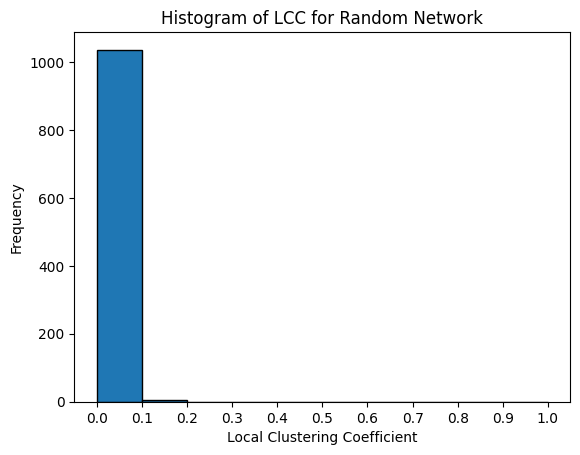

In [ ]:
#Generating our Random Network
#Histogram of Local Clustering Coefficient of random netork.


nodes = G.number_of_nodes()
edges = G.number_of_edges()
probability = edges/(nodes*(nodes-1))
randG =  nx.erdos_renyi_graph(nodes,probability,directed=True)
local_cc = nx.clustering(randG)

print("Number of Nodes: ",randG.number_of_nodes())
print("Number of Edges: ",randG.number_of_nodes())
print("Probability: ",probability)


plt.hist(list(local_cc.values()), bins=[0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6,
                                          0.7, 0.8, 0.9, 1.0], edgecolor='black')
plt.xticks(np.arange(0, 1.1, 0.1))
plt.xlabel("Local Clustering Coefficient")
plt.ylabel("Frequency")
plt.title("Histogram of LCC for Random Network")
plt.show()

[1.2666666666666666, 4.020408163265306, 1.0333333333333334, 1.0, 1.0, 1.2857142857142858, 1.0, 2.743076923076923, 1.1666666666666667, 1.0666666666666667, 1.0, 1.25, 8.065934554164736, 1.0, 1.1666666666666667, 3.6663865546218486, 1.55, 1.5833333333333333, 1.3, 2.996732026143791, 4.006451612903226, 1.1666666666666667]


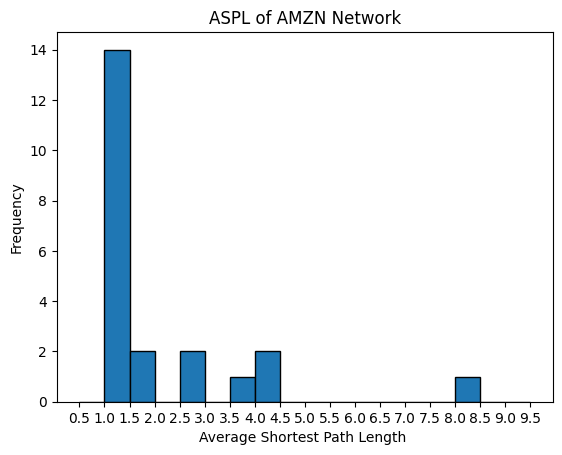

In [ ]:
# Finding average shortest path length for our network


#As our network is not strongly connected we take all the strongly connected component
# (with more than one vertex) and find their average shortest path instead
avg_path = []
sccs = list(nx.strongly_connected_components(G))

for scc in sccs:
    if len(scc) == 1:
      continue
    subG = G.subgraph(scc)
    path = nx.average_shortest_path_length(subG)
    avg_path.append(path)

print(avg_path)

plt.hist(avg_path, bins=[x*0.5 for x in range(1,20)], edgecolor='black')
plt.xticks([x*0.5 for x in range(1,20)])
plt.xlabel('Average Shortest Path Length ')
plt.ylabel('Frequency')
plt.title('ASPL of AMZN Network')
plt.show()


1006
[5.0293107029465]


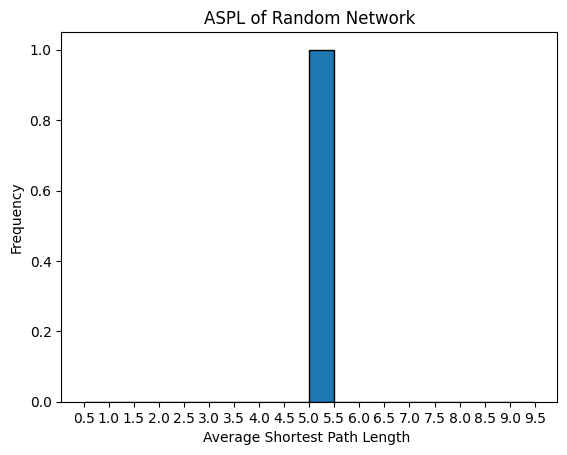

In [ ]:
# Finding average shortest path length for random


avg_path = []
sccs = list(nx.strongly_connected_components(randG))

for scc in sccs:
    if len(scc) == 1:
      continue
    print(len(scc))
    subG = randG.subgraph(scc)
    path = nx.average_shortest_path_length(subG)
    avg_path.append(path)

print(avg_path)

plt.hist(avg_path, bins=[x*0.5 for x in range(1,20)], edgecolor='black')
plt.xticks([x*0.5 for x in range(1,20)])
plt.xlabel('Average Shortest Path Length ')
plt.ylabel('Frequency')
plt.title('ASPL of Random Network')
plt.show()


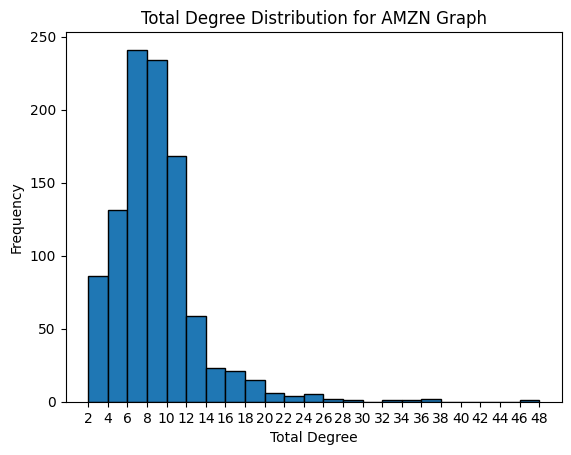

In [ ]:
# Plot a histogram of the Total-Degree distribution of our network


degrees = [deg for node, deg in G.degree()]
plt.hist(degrees, bins=[x*2 for x in range(1,25)], edgecolor='black')
plt.xticks([x*2 for x in range(1,25)])
plt.xlabel('Total Degree')
plt.ylabel('Frequency')
plt.title('Total Degree Distribution for AMZN Graph')
plt.show()

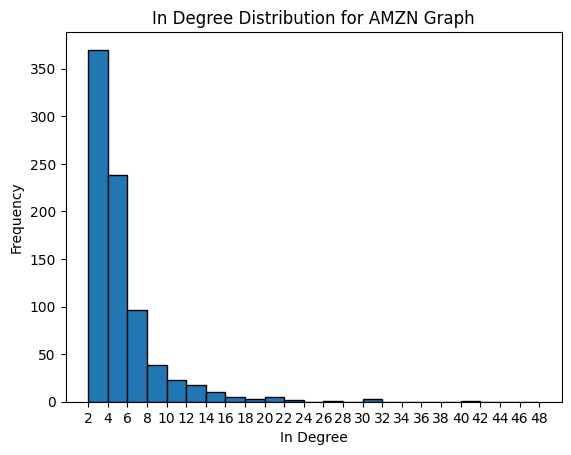

In [ ]:
# Plot a histogram of the In-Degree distribution of our network


degrees = [deg for node, deg in G.in_degree()]
plt.hist(degrees, bins=[x*2 for x in range(1,25)], edgecolor='black')
plt.xticks([x*2 for x in range(1,25)])
plt.xlabel('In Degree')
plt.ylabel('Frequency')
plt.title('In Degree Distribution for AMZN Graph')
plt.show()

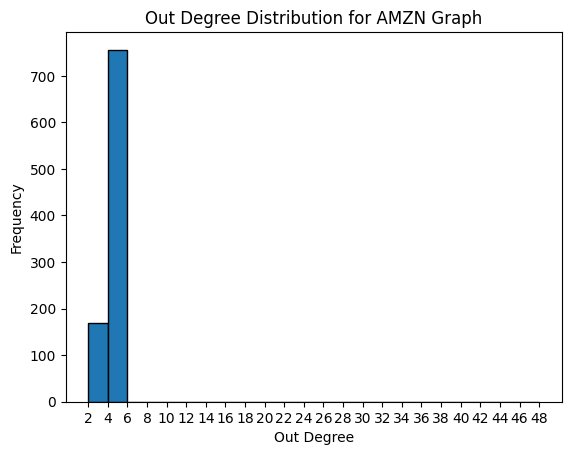

In [ ]:
# Plot a histogram of the Out-Degree distribution of our network


degrees = [deg for node, deg in G.out_degree()]
plt.hist(degrees, bins=[x*2 for x in range(1,25)], edgecolor='black')
plt.xticks([x*2 for x in range(1,25)])
plt.xlabel('Out Degree')
plt.ylabel('Frequency')
plt.title('Out Degree Distribution for AMZN Graph')
plt.show()

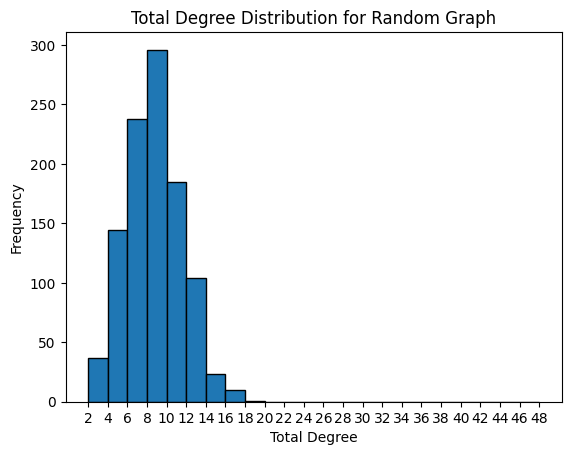

In [ ]:
# Plot a histogram of the Total-Degree distribution of our network

degrees = [deg for node, deg in randG.degree()]
plt.hist(degrees, bins=[x*2 for x in range(1,25)], edgecolor='black')
plt.xticks([x*2 for x in range(1,25)])
plt.xlabel('Total Degree')
plt.ylabel('Frequency')
plt.title('Total Degree Distribution for Random Graph')
plt.show()

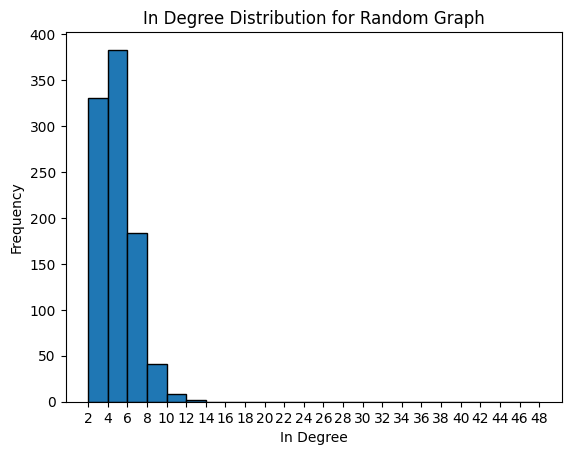

In [ ]:
# Plot a histogram of the In-Degree distribution of our network

degrees = [deg for node, deg in randG.in_degree()]
plt.hist(degrees, bins=[x*2 for x in range(1,25)], edgecolor='black')
plt.xticks([x*2 for x in range(1,25)])
plt.xlabel('In Degree')
plt.ylabel('Frequency')
plt.title('In Degree Distribution for Random Graph')
plt.show()

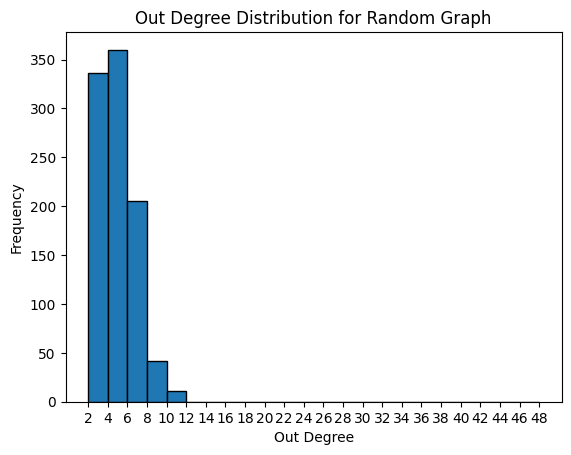

In [ ]:
# Plot a histogram of the Out-Degree distribution of our network

degrees = [deg for node, deg in randG.out_degree()]
plt.hist(degrees, bins=[x*2 for x in range(1,25)], edgecolor='black')
plt.xticks([x*2 for x in range(1,25)])
plt.xlabel('Out Degree')
plt.ylabel('Frequency')
plt.title('Out Degree Distribution for Random Graph')
plt.show()

Calculating best minimal value for power law fit
-0.6230940538527197 0.5332227169574533


/usr/local/lib/python3.10/dist-packages/powerlaw.py:1615: RuntimeWarning: invalid value encountered in true_divide
  CDF = CDF/norm
'nan' in fit cumulative distribution values.
Likely underflow or overflow error: the optimal fit for this distribution gives values that are so extreme that we lack the numerical precision to calculate them.
'nan' in fit cumulative distribution values.
Likely underflow or overflow error: the optimal fit for this distribution gives values that are so extreme that we lack the numerical precision to calculate them.


<Axes: >

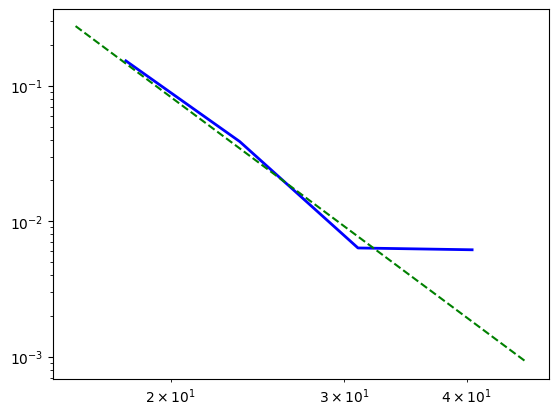

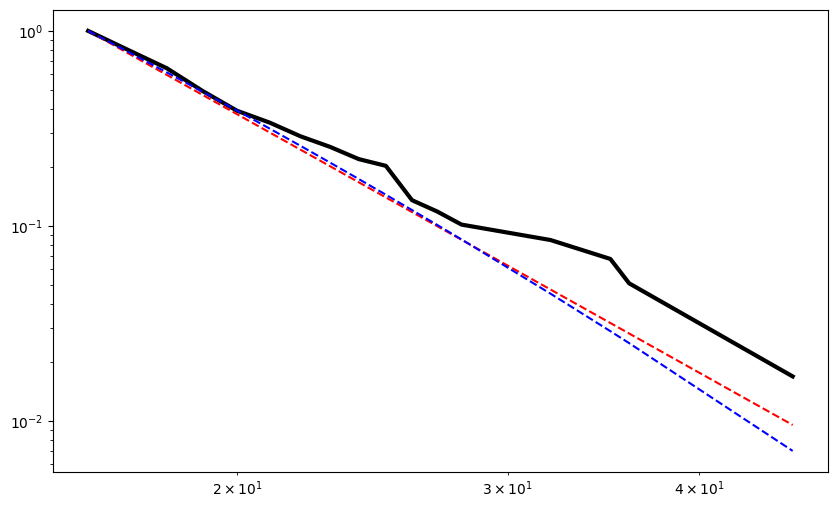

In [ ]:
# NOT USED
# Used to find alpha


degree_sequence = sorted([d for n, d in G.degree()], reverse=True) # used for degree distribution and powerlaw test
fit = powerlaw.Fit(degree_sequence)
fig2 = fit.plot_pdf(color='b', linewidth=2)
fit.power_law.plot_pdf(color='g', linestyle='--', ax=fig2)
R, p = fit.distribution_compare('power_law', 'lognormal', normalized_ratio=True)
print (R, p)
plt.figure(figsize=(10, 6))
fit.distribution_compare('power_law', 'lognormal')
fig4 = fit.plot_ccdf(linewidth=3, color='black')
fit.power_law.plot_ccdf(ax=fig4, color='r', linestyle='--') #powerlaw
fit.lognormal.plot_ccdf(ax=fig4, color='g', linestyle='--') #lognormal
fit.stretched_exponential.plot_ccdf(ax=fig4, color='b', linestyle='--') #stretched

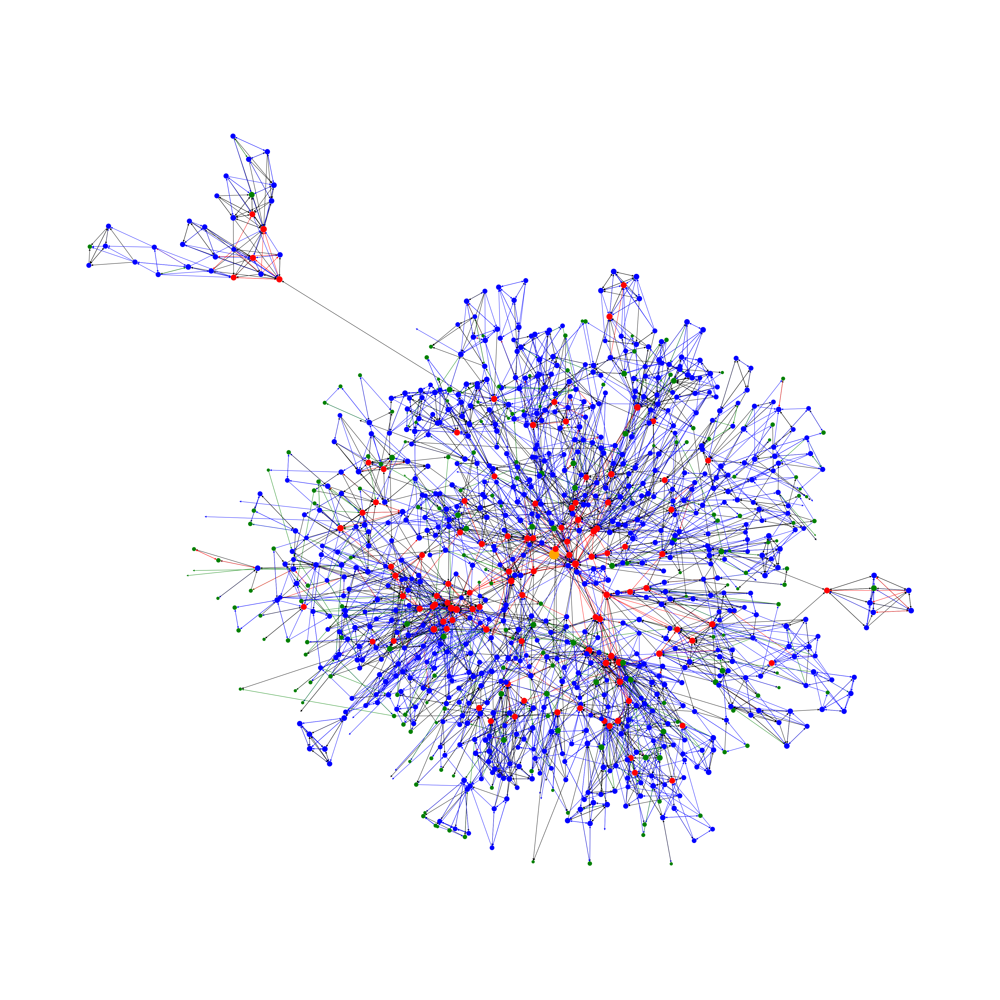

In [ ]:
# Visualising Network


degrees = dict(G.degree())

# set node size proportional to degree
node_size = [100*np.log(degrees[node]) for node in G.nodes()]
node_size[0]= 800;

#Set node color to red if deg > 12, blue if deg > 4 and deg < 12 and green if deg < 4
node_color = []
for node in G.nodes():
    if degrees[node] > 12:
        node_color.append('red')
    elif degrees[node] > 4 and degrees[node] < 12:
        node_color.append('blue')
    else:
        node_color.append('green')
node_color[0]='orange'
edge_color = []
for edge in G.edges():
    if degrees[edge[0]] > 12 and degrees[edge[1]] > 12:
        edge_color.append('red')
    elif degrees[edge[0]] > 4 and degrees[edge[0]] < 12 and degrees[edge[1]] > 4 and degrees[edge[1]] < 12:
        edge_color.append('blue')
    elif degrees[edge[0]] < 4 or degrees[edge[1]] < 4:
        edge_color.append('green')
    elif degrees[edge[0]] != degrees[edge[1]]:
        edge_color.append('black')




#Creating large figure on matplotlib so we get a vector image
fig = plt.figure(figsize=(40, 40))
nx.draw(G, node_size=node_size,node_color=node_color, edge_color = edge_color,pos=nx.kamada_kawai_layout(G))
plt.axis('equal')
plt.show()

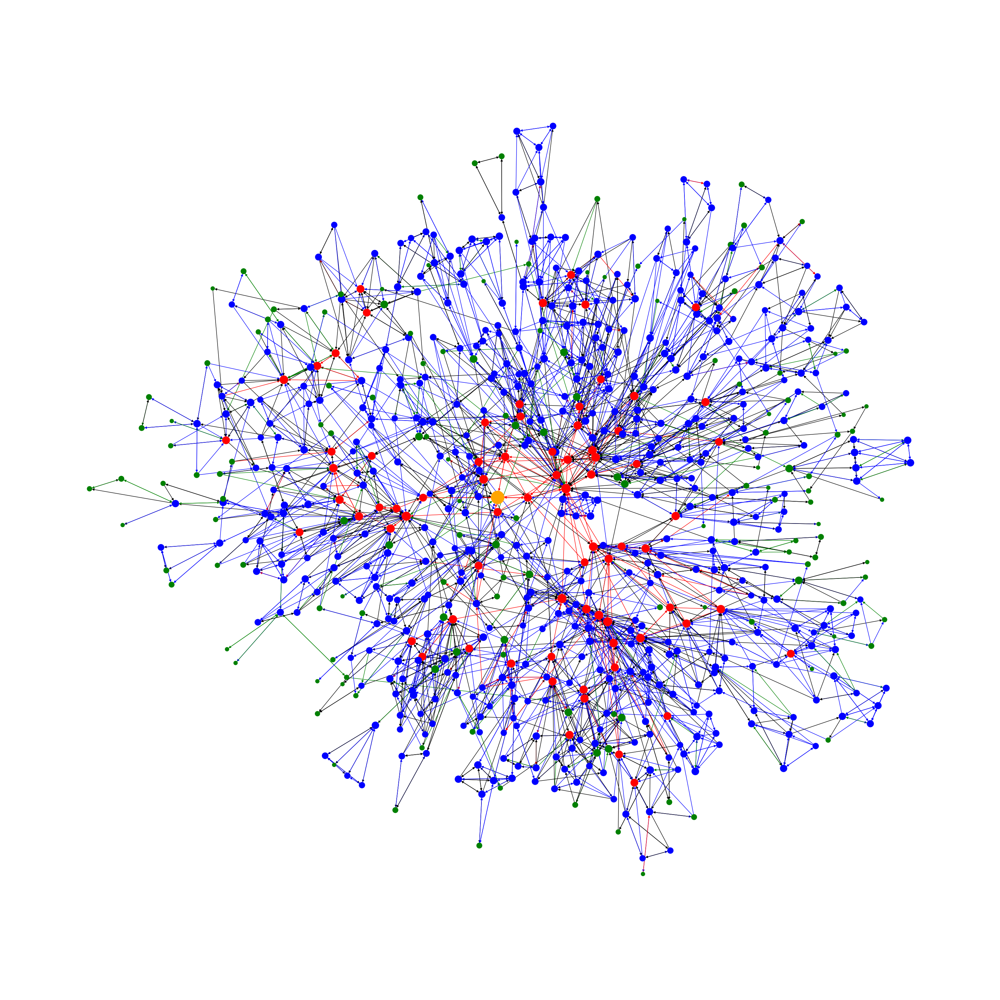

In [ ]:
# Visualising the largest SCC


components = nx.strongly_connected_components(G)
sc = max(components, key=len)
sc = G.subgraph(sc)


degrees = dict(sc.degree())

# set node size proportional to degree
node_size = [100*np.log(degrees[node]) for node in sc.nodes()]
node_size[0]= 800;

#Set node color to red if deg > 12, blue if deg > 4 and deg < 12 and green if deg < 4
node_color = []
for node in sc.nodes():
    if degrees[node] > 12:
        node_color.append('red')
    elif degrees[node] > 4 and degrees[node] < 12:
        node_color.append('blue')
    else:
        node_color.append('green')
node_color[0]='orange'
edge_color = []
for edge in sc.edges():
    if degrees[edge[0]] > 12 and degrees[edge[1]] > 12:
        edge_color.append('red')
    elif degrees[edge[0]] > 4 and degrees[edge[0]] < 12 and degrees[edge[1]] > 4 and degrees[edge[1]] < 12:
        edge_color.append('blue')
    elif degrees[edge[0]] < 4 or degrees[edge[1]] < 4:
        edge_color.append('green')
    elif degrees[edge[0]] != degrees[edge[1]]:
        edge_color.append('black')




#Creating large figure on matplotlib so we get a vector image
fig = plt.figure(figsize=(20, 20))
nx.draw(sc, node_size=node_size,node_color=node_color, edge_color = edge_color,pos=nx.kamada_kawai_layout(sc))
plt.axis('equal')
plt.show()

In [ ]:
# Finding the top 10 nodes by all centrality

eig_centrality = nx.eigenvector_centrality(G,max_iter=2000)
top_eig_nodes = sorted(eig_centrality.items(), key=lambda x: x[1], reverse=True)[:10]
top_eig_nodes_num = [n[0] for n in top_eig_nodes]

# Calculate the Katz centrality for all nodes
katz_centrality = nx.katz_centrality(G)
top_katz_nodes = sorted(katz_centrality.items(), key=lambda x: x[1], reverse=True)[:10]
top_katz_nodes_num = [n[0] for n in top_katz_nodes]

# Calculate the closeness centrality for all nodes
close_centrality = nx.closeness_centrality(G)
top_close_nodes  = sorted(close_centrality.items(),key = lambda x : x[1],reverse = True)[:10]
top_close_nodes_num = [n[0] for n in top_close_nodes]

# Calculate the betweenness centrality for all nodes
between_centrality = nx.betweenness_centrality(G)
top_between_nodes = sorted(between_centrality.items(),key = lambda x: x[1],reverse = True)[:10]
top_between_nodes_num = [n[0] for n in top_between_nodes]

deg_centrality = nx.degree_centrality(G)
deg_nodes = sorted(deg_centrality.items(),key = lambda x: x[1],reverse = True)[:10]
deg_nodes_num = [n[0] for n in deg_nodes]

# Print the top 10 nodes by each centrality measure
print("Top 10 nodes by eigenvector centrality:")
print(top_eig_nodes_num)
print()

print("Top 10 nodes by Katz centrality:")
print(top_katz_nodes_num)
print()

print("Top 10 nodes by closeness centrality:")
print(top_close_nodes_num)
print()

print("Top 10 nodes by betweenness centrality:")
print(top_between_nodes_num)
print()

print("Top 10 nodes by degree centrality")
print(deg_nodes_num)


Top 10 nodes by eigenvector centrality:
[317, 987, 1046, 1047, 1048, 1049, 262, 260, 12, 665]

Top 10 nodes by Katz centrality:
[8, 33, 23, 63, 30, 18, 99, 13, 20, 93]

Top 10 nodes by closeness centrality:
[8, 23, 30, 13, 21, 22, 20, 24, 7, 9]

Top 10 nodes by betweenness centrality:
[18, 8, 97, 32, 63, 481, 150, 13, 21, 30]

Top 10 nodes by degree centrality
[8, 18, 99, 33, 63, 151, 100, 23, 11, 13]


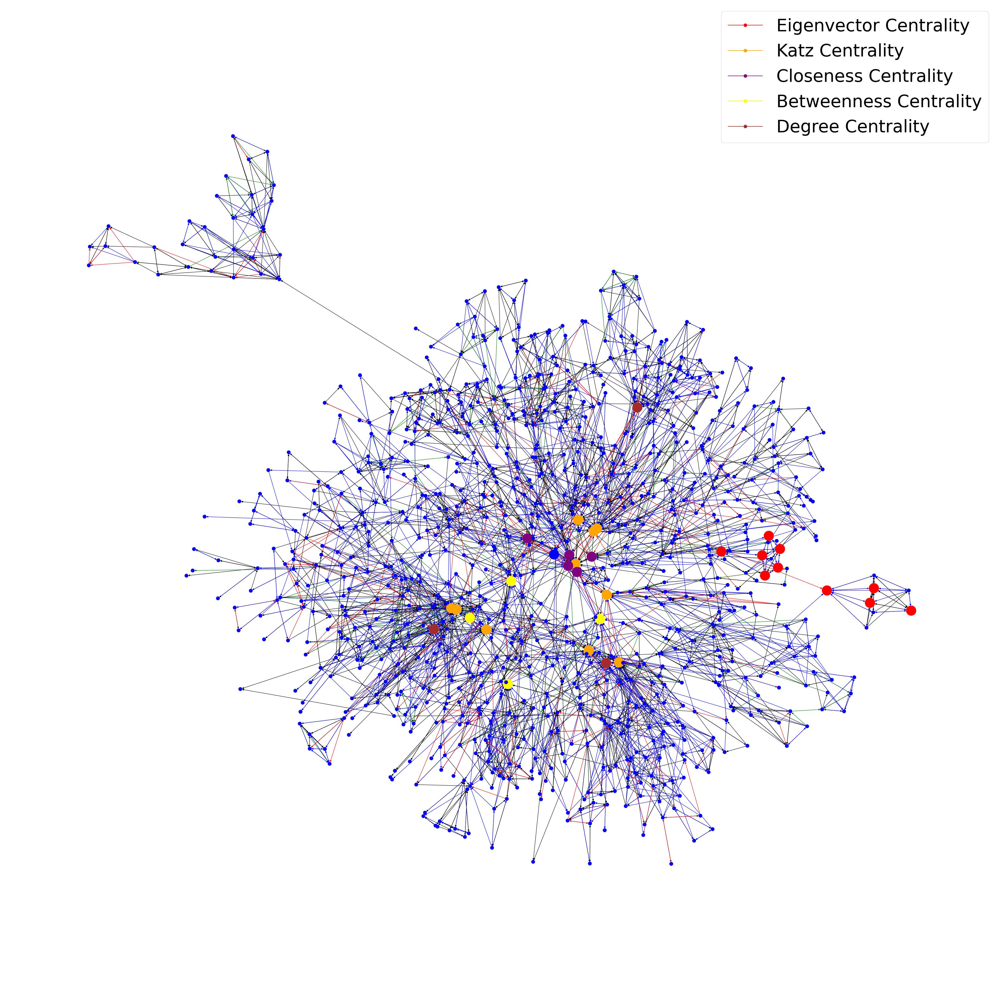

In [ ]:
# Visualising the top 10 nodes of all centrality

node_size = [800 if node in top_eig_nodes_num or node in top_katz_nodes_num or node in top_close_nodes_num or node in top_between_nodes_num or node in deg_nodes_num else 100 for node in G.nodes()]
node_size[0]= 800;


node_colors = ["red" if n in top_eig_nodes_num else "orange" if n in top_katz_nodes_num else "purple" if n in top_close_nodes_num else "yellow" if n in top_between_nodes_num else "brown" if n in deg_nodes_num else "blue" for n in G.nodes()]





#Creating large figure on matplotlib so we get a vector image
fig = plt.figure(figsize=(40, 40))
nx.draw(G, node_size=node_size,node_color=node_colors, edge_color = edge_color,pos=nx.kamada_kawai_layout(G))
eig_patch = plt.plot([], [], marker="o", ms=10, mec="none", color="red", label="Eigenvector Centrality")[0]
katz_patch = plt.plot([], [], marker="o", ms=10, mec="none", color="orange", label="Katz Centrality")[0]
close_patch = plt.plot([], [], marker="o", ms=10, mec="none", color="purple", label="Closeness Centrality")[0]
between_patch = plt.plot([], [], marker="o", ms=10, mec="none", color="yellow", label="Betweenness Centrality")[0]
deg_patch = plt.plot([], [], marker="o", ms=10, mec="none", color="brown", label="Degree Centrality")[0]
plt.legend(handles=[eig_patch, katz_patch, close_patch, between_patch, deg_patch], loc="best",fontsize=50)
plt.axis('equal')
plt.show()


In [ ]:
pr = nx.pagerank(G)

# Compute HITS centrality
hubs, authorities = nx.hits(G)

# Print the top nodes based on their PageRank scores
top_pr_nodes = sorted(pr, key=pr.get, reverse=True)[:10]

# Print the top nodes based on their HITS hub scores
top_hub_nodes = sorted(hubs, key=hubs.get, reverse=True)[:10]


# Print the top nodes based on their HITS authority scores
top_auth_nodes = sorted(authorities, key=authorities.get, reverse=True)[:10]


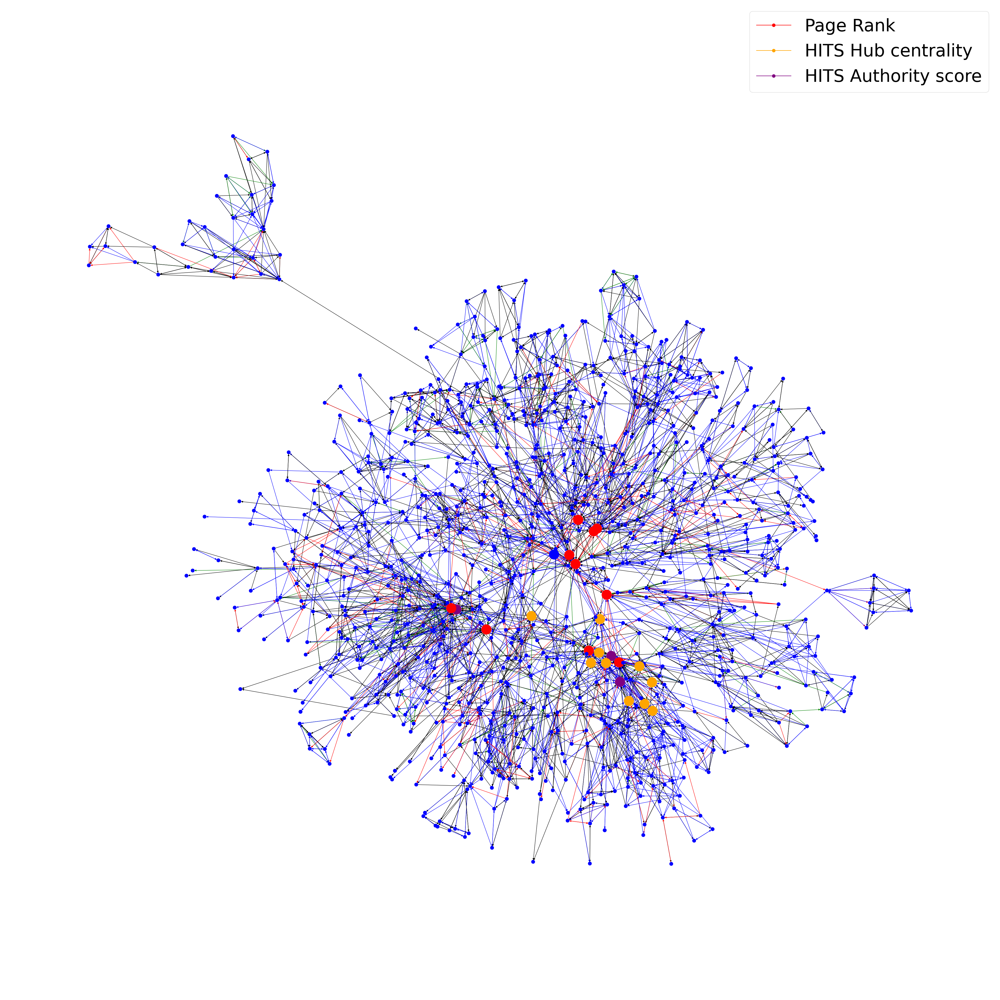

In [ ]:
# Visualising top 10 nodes by hubs,authorities,and page-rank

node_size = [800 if node in top_pr_nodes or node in top_hub_nodes or node in top_auth_nodes else 100 for node in G.nodes()]
node_size[0]= 800;


node_colors = ["red" if n in top_pr_nodes else "orange" if n in top_hub_nodes else "purple" if n in top_auth_nodes else "blue" for n in G.nodes()]





#Creating large figure on matplotlib so we get a vector image
fig = plt.figure(figsize=(40, 40))
nx.draw(G, node_size=node_size,node_color=node_colors, edge_color = edge_color,pos=nx.kamada_kawai_layout(G))
eig_patch = plt.plot([], [], marker="o", ms=10, mec="none", color="red", label="Page Rank")[0]
katz_patch = plt.plot([], [], marker="o", ms=10, mec="none", color="orange", label="HITS Hub centrality ")[0]
close_patch = plt.plot([], [], marker="o", ms=10, mec="none", color="purple", label="HITS Authority score")[0]
plt.legend(handles=[eig_patch, katz_patch, close_patch], loc="best",fontsize=50)
plt.axis('equal')
plt.show()


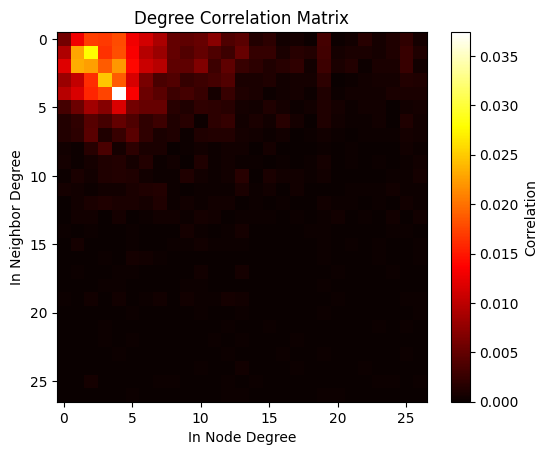

In [ ]:
#Calculating Assortativity Matrix of (in,in) degrees

degree_matrix = nx.degree_mixing_matrix(G,x='in',y='in',normalized=True)

# Convert the matrix into a numpy array
degree_matrix = np.array(degree_matrix)

# Plotting the degree correlation matrix
plt.imshow(degree_matrix, cmap='hot', interpolation='nearest')
plt.colorbar(label='Correlation')
plt.xlabel('In Node Degree')
plt.ylabel('In Neighbor Degree')
plt.title('Degree Correlation Matrix')
plt.show()


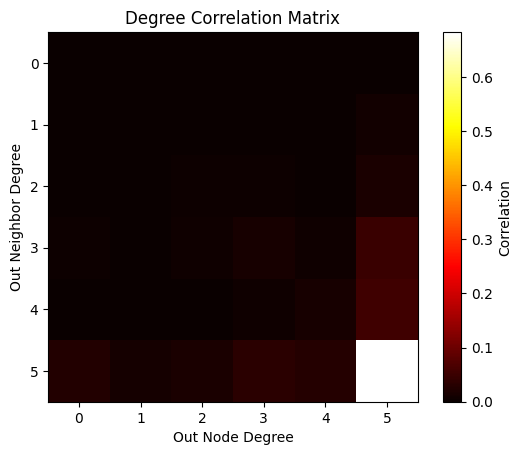

In [ ]:
#Calculating Assortativity Matrix of (out,out) degrees

degree_matrix = nx.degree_mixing_matrix(G,x='out',y='out',normalized=True)

# Convert the matrix into a numpy array
degree_matrix = np.array(degree_matrix)

# Plotting the degree correlation matrix
plt.imshow(degree_matrix, cmap='hot', interpolation='nearest')
plt.colorbar(label='Correlation')
plt.xlabel('Out Node Degree')
plt.ylabel('Out Neighbor Degree')
plt.title('Degree Correlation Matrix')
plt.show()


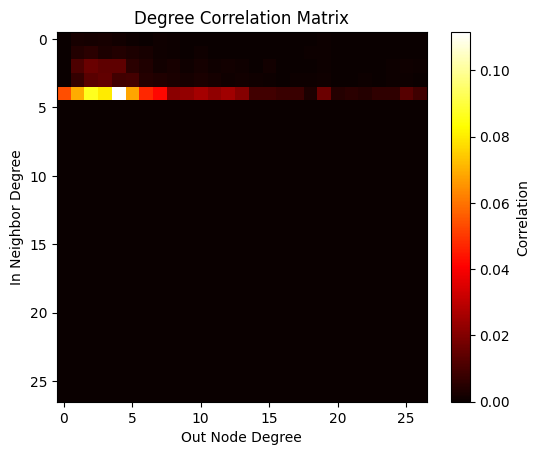

In [ ]:
#Calculating Assortativity Matrix of (out,in) degrees

degree_matrix = nx.degree_mixing_matrix(G,x='out',y='in',normalized=True)

# Convert the matrix into a numpy array
degree_matrix = np.array(degree_matrix)

# Plotting the degree correlation matrix
plt.imshow(degree_matrix, cmap='hot', interpolation='nearest')
plt.colorbar(label='Correlation')
plt.xlabel('Out Node Degree')
plt.ylabel('In Neighbor Degree')
plt.title('Degree Correlation Matrix')
plt.show()

